In [ ]:
pip install pyicu

     |████████████████████████████████| 255 kB 575 kB/s            
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for pyicu: filename=PyICU-2.10.2-cp37-cp37m-linux_x86_64.whl size=1893875 sha256=711f71fa7426c48a27e90b731de84d582f7f23a483bb8157386b89260b8a2634
  Stored in directory: /root/.cache/pip/wheels/eb/9a/92/8aac41f3aecd15d913695d08f07687cf1d92067e3d38995968
Successfully built pyicu
Note: you may need to restart the kernel to use updated packages.


In [ ]:
pip install pycld2

     |████████████████████████████████| 41.4 MB 60.7 MB/s            
  Preparing metadata (setup.py) ... done
  Created wheel for pycld2: filename=pycld2-0.41-cp37-cp37m-linux_x86_64.whl size=9917755 sha256=27d9b6f0f0b4b8110af9cf40196f399c401eb47c6c22a46f0a49391c994552fb
  Stored in directory: /root/.cache/pip/wheels/ed/e4/58/ed2e9f43c07d617cc81fe7aff0fc6e42b16c9cf6afe960b614
Successfully built pycld2
Note: you may need to restart the kernel to use updated packages.


# Importing Libraries

In [ ]:
import numpy as np 
import pandas as pd
from tqdm.notebook import tqdm
tqdm.pandas()

import matplotlib.pyplot as plt
import seaborn as sns
import warnings

warnings.filterwarnings("ignore")

import nltk
from nltk.corpus import wordnet, stopwords
from nltk import *
from wordcloud import WordCloud, STOPWORDS
import re

import sys
from termcolor import colored
from polyglot.detect import Detector
from polyglot.utils import pretty_list

# Reading the training data file

In [ ]:
train1 = pd.read_csv("/kaggle/input/jigsaw-multilingual-toxic-comment-classification/jigsaw-toxic-comment-train.csv")
train2 = pd.read_csv("/kaggle/input/jigsaw-multilingual-toxic-comment-classification/jigsaw-unintended-bias-train.csv")
valid = pd.read_csv('/kaggle/input/jigsaw-multilingual-toxic-comment-classification/validation.csv')
test = pd.read_csv('/kaggle/input/jigsaw-multilingual-toxic-comment-classification/test.csv')

In [ ]:
train1.head()

,id,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate
0,0000997932d777bf,Explanation\nWhy the edits made under my usern...,0,0,0,0,0,0
1,000103f0d9cfb60f,D'aww! He matches this background colour I'm s...,0,0,0,0,0,0
2,000113f07ec002fd,"Hey man, I'm really not trying to edit war. It...",0,0,0,0,0,0
3,0001b41b1c6bb37e,"""\nMore\nI can't make any real suggestions on ...",0,0,0,0,0,0
4,0001d958c54c6e35,"You, sir, are my hero. Any chance you remember...",0,0,0,0,0,0


In [ ]:
train2.head()

,id,comment_text,toxic,severe_toxicity,obscene,identity_attack,insult,threat,asian,atheist,...,article_id,rating,funny,wow,sad,likes,disagree,sexual_explicit,identity_annotator_count,toxicity_annotator_count
0,59848,"This is so cool. It's like, 'would you want yo...",0.000000,0.000000,0.0,0.000000,0.00000,0.0,NaN,NaN,...,2006,rejected,0,0,0,0,0,0.0,0,4
1,59849,Thank you!! This would make my life a lot less...,0.000000,0.000000,0.0,0.000000,0.00000,0.0,NaN,NaN,...,2006,rejected,0,0,0,0,0,0.0,0,4
2,59852,This is such an urgent design problem; kudos t...,0.000000,0.000000,0.0,0.000000,0.00000,0.0,NaN,NaN,...,2006,rejected,0,0,0,0,0,0.0,0,4
3,59855,Is this something I'll be able to install on m...,0.000000,0.000000,0.0,0.000000,0.00000,0.0,NaN,NaN,...,2006,rejected,0,0,0,0,0,0.0,0,4
4,59856,haha you guys are a bunch of losers.,0.893617,0.021277,0.0,0.021277,0.87234,0.0,0.0,0.0,...,2006,rejected,0,0,0,1,0,0.0,4,47


In [ ]:
train2.toxic = train2.toxic.round().astype(int)
train = pd.concat([train1[['comment_text', 'toxic']],
    train2[['comment_text', 'toxic']].query('toxic==1'),
    train2[['comment_text', 'toxic']].query('toxic==0').sample(n=100000)
    ])
#rate=10
#train = train[::rate]
train.head()

,comment_text,toxic
0,Explanation\nWhy the edits made under my usern...,0
1,D'aww! He matches this background colour I'm s...,0
2,"Hey man, I'm really not trying to edit war. It...",0
3,"""\nMore\nI can't make any real suggestions on ...",0
4,"You, sir, are my hero. Any chance you remember...",0


# Descriptive Analysis

In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 435775 entries, 0 to 1805935
Data columns (total 2 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   comment_text  435775 non-null  object
 1   toxic         435775 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 10.0+ MB


In [ ]:
train.describe()

,toxic
count,435775.000000
mean,0.306603
std,0.461084
min,0.000000
25%,0.000000
50%,0.000000
75%,1.000000
max,1.000000


In [ ]:
print(f"Train data shape: {colored(train.shape, 'red', attrs=['bold'])}")

Train data shape: (435775, 2)


# Checking for Null Values

In [ ]:
train.isnull().sum()

comment_text    0
toxic           0
dtype: int64

# Exploratory Data Analysis
### Word Cloud Creation

In [ ]:
def slashn(x):
    if type(x) == str:
        return x.replace("\n", "")
    else:
        return ""

In [ ]:
nltk.download('punkt') #tokenizer
nltk.download('stopwords') #handle stopwords
nltk.download('wordnet') #Lemmatization

stop_words = stopwords.words('english')

[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /usr/share/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [ ]:
def word_count_review(docs):
    text = ' '.join([slashn(abstract) for abstract in docs])
    corpus = str(text.lower())
    txt = re.sub(r'[^a-z0-9]+',' ',str(corpus)).strip()
    tokens = word_tokenize(txt)
    words = [t for t in tokens if t not in stop_words]
    lemma = WordNetLemmatizer()
    l = [lemma.lemmatize(w) for w in words]
    fdq = FreqDist(l)
    return fdq

In [ ]:
fd = word_count_review(train.comment_text)
fd

FreqDist({'article': 107868, 'page': 75197, 'like': 73339, 'one': 73147, 'would': 71439, 'people': 63744, 'wikipedia': 62863, 'talk': 48732, 'think': 47512, 'time': 46677, ...})

(-0.5, 3999.5, 1999.5, -0.5)

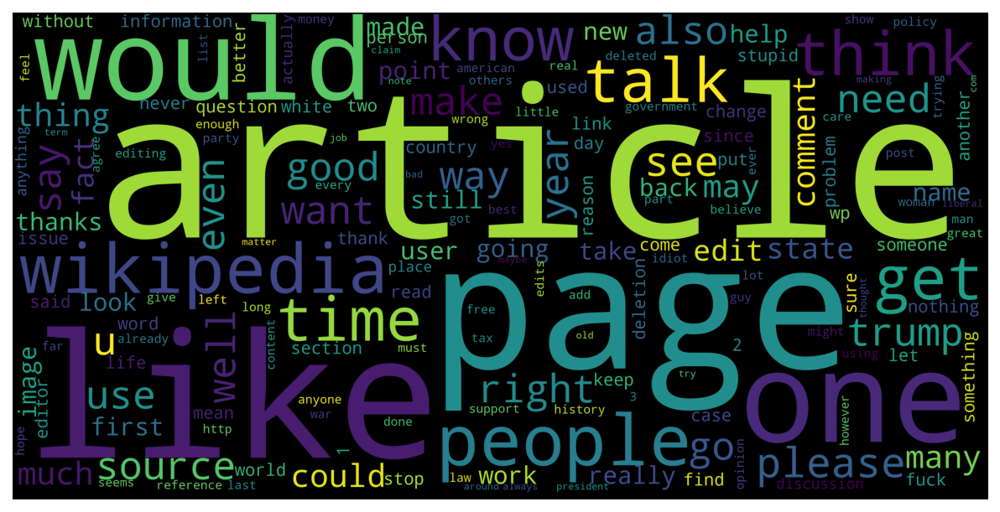

In [ ]:
plt.figure(figsize=(10,10),dpi=150)
wc = WordCloud(scale=10).generate_from_frequencies(fd)

plt.imshow(wc)
plt.axis('off')

## Getting acquainted with POLYGLOT library
#### Languages Supported

In [ ]:
print(pretty_list(Detector.supported_languages()))

  1. Abkhazian                  2. Afar                       3. Afrikaans                
  4. Akan                       5. Albanian                   6. Amharic                  
  7. Arabic                     8. Armenian                   9. Assamese                 
 10. Aymara                    11. Azerbaijani               12. Bashkir                  
 13. Basque                    14. Belarusian                15. Bengali                  
 16. Bihari                    17. Bislama                   18. Bosnian                  
 19. Breton                    20. Bulgarian                 21. Burmese                  
 22. Catalan                   23. Cebuano                   24. Cherokee                 
 25. Nyanja                    26. Corsican                  27. Croatian                 
 28. Croatian                  29. Czech                     30. Chinese                  
 31. Chinese                   32. Chinese                   33. Chinese                  

In [ ]:
def get_language(text):
    return Detector("".join(x for x in text if x.isprintable()),quiet=True).languages[0].name
h = get_language("Helló, hogy vagy")
i = get_language("Dia duit, conas atá tú")
e = get_language("hello, how are you")
p = get_language("ਹੈਲੋ ਤੁਸੀ ਕਿਵੇਂ ਹੋ")
t = get_language("сәлам, хәлләрең ничек")
k = get_language("안녕하세요. 어떻게 지내세요")
m = get_language("ഹലോ, നിങ്ങൾക്ക് സുഖമാണോ")

In [ ]:
print(f"Helló, hogy vagy: {colored(h, 'blue', attrs=['bold','underline'])}")
print(f"Dia duit, conas atá tú: {colored(i, 'red', attrs=['bold','underline'])}")
print(f"hello, how are you: {colored(e, 'yellow', attrs=['bold','underline'])}")
print(f"ਹੈਲੋ ਤੁਸੀ ਕਿਵੇਂ ਹੋ: {colored(p, 'cyan', attrs=['bold','underline'])}")
print(f"сәлам, хәлләрең ничек: {colored(t, 'white', attrs=['bold','underline'])}")
print(f"안녕하세요. 어떻게 지내세요: {colored(k, 'magenta', attrs=['bold','underline'])}")
print(f"ഹലോ, നിങ്ങൾക്ക് സുഖമാണ: {colored(m, 'green', attrs=['bold','underline'])}")

Helló, hogy vagy: Hungarian
Dia duit, conas atá tú: Irish
hello, how are you: English
ਹੈਲੋ ਤੁਸੀ ਕਿਵੇਂ ਹੋ: Punjabi
сәлам, хәлләрең ничек: Tatar
안녕하세요. 어떻게 지내세요: Korean
ഹലോ, നിങ്ങൾക്ക് സുഖമാണ: Malayalam


#### Assigning a column of languages corresponding to the comment_text column

In [ ]:
train['language'] = train["comment_text"].apply(get_language)

In [ ]:
train.head()

,comment_text,toxic,language
0,Explanation\nWhy the edits made under my usern...,0,English
1,D'aww! He matches this background colour I'm s...,0,English
2,"Hey man, I'm really not trying to edit war. It...",0,English
3,"""\nMore\nI can't make any real suggestions on ...",0,English
4,"You, sir, are my hero. Any chance you remember...",0,English


#### Languages in the training data set and their counts

In [ ]:
train.language.unique()

array(['English', 'Azerbaijani', 'Basque', 'un', 'Interlingua', 'German',
       'Javanese', 'Volapük', 'Norwegian Nynorsk', 'Scots', 'Dutch',
       'Polish', 'Greek', 'Manx', 'Portuguese', 'Ganda', 'Hungarian',
       'Kinyarwanda', 'Danish', 'Latin', 'Western Frisian', 'Hmong',
       'Galician', 'Italian', 'Fijian', 'Sanskrit', 'Occitan', 'Xhosa',
       'Quechua', 'Welsh', 'Maltese', 'Nyanja', 'Czech', 'Oromo',
       'Tagalog', 'Hawaiian', 'Romansh', 'Turkish', 'Irish', 'Venda',
       'Indonesian', 'Icelandic', 'Northern Sotho', 'Uzbek', 'Zulu',
       'Interlingue', 'Malagasy', 'Swedish', 'Breton', 'Somali',
       'Luxembourgish', 'Swahili', 'Faroese', 'Wolof', 'Spanish',
       'Tsonga', 'zzp', 'Shona', 'French', 'Tongan', 'Southern Sotho',
       'Norwegian', 'Lithuanian', 'Malay', 'Tamil', 'Corsican',
       'Japanese', 'Turkmen', 'Scottish Gaelic', 'Nauru', 'Samoan',
       'Estonian', 'Waray', 'Klingon', 'Khasi', 'Latvian', 'Albanian',
       'Slovak', 'Haitian Creole', '

In [ ]:
print("Number of Unique Languages:",train.language.nunique())

Number of Unique Languages: 144


### Comparison between English and Non English Languages

In [ ]:
import plotly.express as px

lang_list = sorted(list(set(train["language"])))
counts = [list(train["language"]).count(cont) for cont in lang_list]
df = pd.DataFrame(np.transpose([lang_list, counts]))
df.columns = ["Language", "Count"]
df["Count"] = df["Count"].apply(int)

df_en = pd.DataFrame(np.transpose([["English", "Non-English"], [max(counts), sum(counts) - max(counts)]]))
df_en.columns = ["Language", "Count"]
df_en.head()

,Language,Count
0,English,431819
1,Non-English,3956


In [ ]:
df_en.Count = df_en.Count.astype(int)

<AxesSubplot:xlabel='Language'>

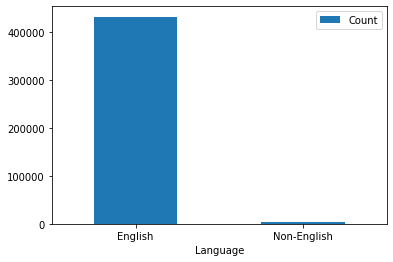

In [ ]:
df_en.plot.bar(x="Language", y="Count", rot=0)

### Comparison of Non English languages with comments appearing between 20 and 30 times

In [ ]:
dfq = df.query("Language != 'English' and Language != 'un'").query("Count >= 20 and Count <= 30")
fig1 = px.bar(dfq, y="Language", x="Count", title="Language of non-English comments", text="Count", orientation="h",
             pattern_shape="Language", pattern_shape_sequence=["|", "/", "+"], height=500)
fig1.update_traces(texttemplate='%{text:.2s}',  textposition="outside",marker_color='teal')
fig1.update_layout(showlegend=False)
fig1

### Comparison of Non English languages with comments appearing more than 50 times

In [ ]:
dfq1 = df.query("Language != 'English' and Language != 'un'").query("Count >= 50")
fig1 =px.scatter(dfq1, y="Language", x="Count", title="Count of non-English Language", size="Count", color="Language", log_x=True, size_max=60)
fig1.update_traces(mode="markers")
fig1.update_layout(showlegend=True)
fig1

### Comment Word Distribution

In [ ]:
import plotly.figure_factory as ff

def new_len(x):
    if type(x) is str:
        return len(x.split())
    else:
        return 0

train["comment_words"] = train["comment_text"].apply(new_len)
nums = train.query("comment_words != 0 and comment_words < 200")["comment_words"]
fig = ff.create_distplot(hist_data=[nums],group_labels=["All comments"],colors=["indigo"])

fig.update_layout(title_text="Word distribution per Comment", xaxis_title="Comment words", showlegend=False)
fig.show()

### Average Comment Words vs Language
Languages where the average number of words in comments is less than 200

In [ ]:
import plotly.graph_objects as go

dfaa = pd.DataFrame(np.transpose([lang_list, train.groupby("language").mean()["comment_words"]]))
dfaa.columns = ["Language", "avg_comment_words"]
dfaa["avg_comment_words"] = dfaa["avg_comment_words"].apply(float)
dfaa = dfaa.query("avg_comment_words < 200")
fig = go.Figure()
fig.add_trace(go.Bar(y=dfaa["avg_comment_words"], x=dfaa["Language"]))
fig.update_layout(xaxis_title="Average Count of words", yaxis_title="Language", title_text="Language Versus Average Number of Words in comments")
fig.show()

Languages where the average number of words in comments is more than 200

In [ ]:
import plotly.graph_objects as go

dfab = pd.DataFrame(np.transpose([lang_list, train.groupby("language").mean()["comment_words"]]))
dfab.columns = ["Language", "avg_comment_words"]
dfab["avg_comment_words"] = dfab["avg_comment_words"].apply(float)
dfab = dfab.query("avg_comment_words > 200")
fig = go.Figure()
fig.add_trace(go.Bar(y=dfab["avg_comment_words"], x=dfab["Language"]))
fig.update_layout(xaxis_title="Average Count of words", yaxis_title="Language", title_text="Language Versus Average Number of Words in comments")
fig.show()

In [ ]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

def polarity_score(x):
    if type(x) == str:
        return SIA.polarity_scores(x)
    else:
        return 1000
    
SIA = SentimentIntensityAnalyzer()
train["polarity"] = train["comment_text"].progress_apply(polarity_score)

  0%|          | 0/435775 [00:00<?, ?it/s]

In [ ]:
fig = go.Figure(go.Histogram(x=[pols["neg"] for pols in train["polarity"] if pols["neg"] != 0], marker=dict(color='teal')))

fig.update_layout(title_text="Negative sentiment", template="simple_white")
fig.show()

In [ ]:
fig = go.Figure(go.Histogram(x=[p["pos"] for p in train["polarity"] if p["pos"] != 0], marker=dict(color='darkblue')))
fig.update_layout(title_text="Positive sentiment", template="simple_white")
fig.show()

Toxicity in Comparison with Negativity and Positivity

In [ ]:
#train["negativity"] = train["polarity"].apply(lambda x: x["neg"])
#one = train.query("toxic == 1")["negativity"]
#zero = train.query("toxic == 0")["negativity"]

#fig = ff.create_distplot(hist_data=[one, zero],group_labels=["Toxic", "Non-toxic"],colors=["slategrey", "dodgerblue"], show_hist=False)

#fig.update_layout(title_text="Negativity vs. Toxicity", xaxis_title="Negativity", template="simple_white")
#fig.show()

In [ ]:
#train["positivity"] = train["polarity"].apply(lambda x: x["pos"])
#nums_1 = train.sample(frac=0.1).query("toxic == 1")["positivity"]
#nums_2 = train.sample(frac=0.1).query("toxic == 0")["positivity"]

#fig = ff.create_distplot(hist_data=[nums_1, nums_2],group_labels=["Toxic", "Non-toxic"], colors=["dodgerblue", "purple"], show_hist=False)

#fig.update_layout(title_text="Positivity vs. Toxicity", xaxis_title="Positivity", template="simple_white")
#fig.show()

### Readability

In [ ]:
pip install textstat

     |████████████████████████████████| 105 kB 808 kB/s            
     |████████████████████████████████| 2.0 MB 2.6 MB/s            
Note: you may need to restart the kernel to use updated packages.


In [ ]:
import textstat
train["flesch_reading_ease"] = train["comment_text"].progress_apply(textstat.flesch_reading_ease)
fig = go.Figure(go.Histogram(x=train.query("flesch_reading_ease > 0")["flesch_reading_ease"], marker=dict(color='dodgerblue')))

fig.update_layout(title_text="Flesch reading ease", template="simple_white")
fig.show()

  0%|          | 0/435775 [00:00<?, ?it/s]